# LunarLander-v3 Project using DQN and PPO

# 1. Libraries

In [1]:
# ====== Libraries  ======
import os
import random
import numpy as np

import gymnasium as gym

# Plots
import matplotlib.pyplot as plt
%matplotlib inline

# DQN 
from stable_baselines3 import DQN
from stable_baselines3.common.vec_env import DummyVecEnv, VecMonitor
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import BaseCallback, EvalCallback
from stable_baselines3.common.monitor import Monitor


from collections import deque, namedtuple
import random
import numpy as np
import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn

from IPython.display import Image, display


# 2. Create LunarLander-v3 environment

In [2]:
ENV_ID = "LunarLander-v3"
OUT_DIR = "runs_lunarlander"
os.makedirs(OUT_DIR, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)
print("Gymnasium:", gym.__version__)

Device: cpu
Gymnasium: 1.2.3


In [3]:
env = gym.make(ENV_ID)
obs, _ = env.reset(seed=42)
print("Env:", ENV_ID)
print("Obs space:", env.observation_space)
print("Action space:", env.action_space)
print("Obs shape:", obs.shape)
print("Example obs:", obs)
env.close()

Env: LunarLander-v3
Obs space: Box([ -2.5        -2.5       -10.        -10.         -6.2831855 -10.
  -0.         -0.       ], [ 2.5        2.5       10.        10.         6.2831855 10.
  1.         1.       ], (8,), float32)
Action space: Discrete(4)
Obs shape: (8,)
Example obs: [ 0.00229702  1.4181306   0.2326471   0.3204666  -0.00265488 -0.05269805
  0.          0.        ]


# 4. CLASSES (ReplayBuffer, Network, DQNAgent)

In [4]:
Transition = namedtuple("Transition", ["s", "a", "r", "s2", "d"])

class ReplayBuffer:
    def __init__(self, capacity, device):
        self.buf = deque(maxlen=capacity)
        self.device = device

    def __len__(self):
        return len(self.buf)

    def add(self, s, a, r, s2, d):
        self.buf.append(Transition(s, a, r, s2, d))

    def sample(self, batch_size):
        batch = random.sample(self.buf, batch_size)
        s  = torch.tensor(np.vstack([t.s  for t in batch]), dtype=torch.float32, device=self.device)
        a  = torch.tensor(np.vstack([t.a  for t in batch]), dtype=torch.int64,   device=self.device)
        r  = torch.tensor(np.vstack([t.r  for t in batch]), dtype=torch.float32, device=self.device)
        s2 = torch.tensor(np.vstack([t.s2 for t in batch]), dtype=torch.float32, device=self.device)
        d  = torch.tensor(np.vstack([t.d  for t in batch]).astype(np.uint8), dtype=torch.float32, device=self.device)
        return s, a, r, s2, d

class Network(nn.Module):
    def __init__(self, state_size, action_size, hidden=256, seed=0):
        super().__init__()
        torch.manual_seed(seed)
        self.net = nn.Sequential(
            nn.Linear(state_size, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, action_size),
        )
    def forward(self, x):
        return self.net(x)

class DQNAgent:
    def __init__(
        self, state_size, action_size,
        lr, gamma, buffer_size, batch_size, tau,
        update_every, learning_starts, grad_clip, seed
    ):
        random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
        self.device = DEVICE
        self.action_size = action_size

        self.q = Network(state_size, action_size, seed=seed).to(self.device)
        self.q_tgt = Network(state_size, action_size, seed=seed+1).to(self.device)
        self.q_tgt.load_state_dict(self.q.state_dict())

        self.opt = optim.Adam(self.q.parameters(), lr=lr)
        self.buf = ReplayBuffer(buffer_size, self.device)

        self.gamma = gamma
        self.batch_size = batch_size
        self.tau = tau
        self.update_every = update_every
        self.learning_starts = learning_starts
        self.grad_clip = grad_clip

        self.total_steps = 0

    def act(self, state, eps):
        if random.random() < eps:
            return random.randrange(self.action_size)
        s = torch.tensor(state, dtype=torch.float32, device=self.device).unsqueeze(0)
        with torch.no_grad():
            qvals = self.q(s)
        return int(torch.argmax(qvals, dim=1).item())

    def store(self, s, a, r, s2, done):
        self.buf.add(s, a, r, s2, done)

    def soft_update(self):
        for p_tgt, p in zip(self.q_tgt.parameters(), self.q.parameters()):
            p_tgt.data.mul_(1.0 - self.tau)
            p_tgt.data.add_(self.tau * p.data)

    def train_step(self):
        if len(self.buf) < max(self.batch_size, self.learning_starts):
            return None

        s, a, r, s2, d = self.buf.sample(self.batch_size)

        with torch.no_grad():
            a2 = torch.argmax(self.q(s2), dim=1, keepdim=True)
            q2 = self.q_tgt(s2).gather(1, a2)
            y  = r + self.gamma * q2 * (1.0 - d)

        q_sa = self.q(s).gather(1, a)
        loss = F.smooth_l1_loss(q_sa, y)

        self.opt.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(self.q.parameters(), self.grad_clip)
        self.opt.step()

        self.soft_update()
        return float(loss.item())


# 5. UTILITIES (make_env, eval, gif)

In [5]:
def make_env(seed: int, render_mode=None):
    env = gym.make(ENV_ID, render_mode=render_mode)
    env.reset(seed=seed)
    env.action_space.seed(seed)
    return env

@torch.no_grad()
def evaluate_dqn(agent, n_episodes=20, seed=0, max_steps=1000):
    env = make_env(seed + 10_000)
    rets, lens = [], []
    for ep in range(n_episodes):
        s, _ = env.reset(seed=seed + 10_000 + ep)
        ep_ret, ep_len = 0.0, 0
        for _ in range(max_steps):
            a = agent.act(s, eps=0.0)
            s, r, terminated, truncated, _ = env.step(a)
            ep_ret += float(r); ep_len += 1
            if terminated or truncated:
                break
        rets.append(ep_ret); lens.append(ep_len)
    env.close()
    return float(np.mean(rets)), float(np.std(rets, ddof=1)), rets, lens

def moving_avg(x, w=100):
    x = np.asarray(x, float)
    if len(x) < w:
        return np.full_like(x, np.nan)
    c = np.convolve(x, np.ones(w)/w, mode="valid")
    return np.concatenate([np.full(w-1, np.nan), c])

def find_center_seed(agent, base_seed, tries, center_tol, max_steps):
    env = make_env(base_seed)
    for i in range(tries):
        s, _ = env.reset(seed=base_seed + i)
        for _ in range(max_steps):
            a = agent.act(s, eps=0.0)
            s, r, terminated, truncated, _ = env.step(a)
            if terminated or truncated:
                x = float(s[0])
                vx, vy = float(s[2]), float(s[3])
                left, right = float(s[6]), float(s[7])
                landed = (left > 0.5 or right > 0.5) and abs(vx) < 0.35 and abs(vy) < 0.35
                if landed and abs(x) < center_tol:
                    env.close()
                    return base_seed + i
                break
    env.close()
    return None

def save_gif(agent, seed_gif, gif_path, max_steps=1000, fps=30):
    import imageio
    env = make_env(seed_gif, render_mode="rgb_array")
    s, _ = env.reset(seed=seed_gif)
    frames, total_r = [], 0.0
    for _ in range(max_steps):
        frames.append(env.render())
        a = agent.act(s, eps=0.0)
        s, r, terminated, truncated, _ = env.step(a)
        total_r += float(r)
        if terminated or truncated:
            frames.append(env.render())
            break
    env.close()
    imageio.mimsave(gif_path, frames, fps=fps)
    return float(total_r)


# 6. SINGLE TRAIN ENTRYPOINT: run_dqn(cfg, seed)

In [6]:
def run_dqn(cfg: dict, seed: int, run_name: str):
    cfg = dict(cfg)
    # defaults
    cfg.setdefault("gamma", 0.99)
    cfg.setdefault("grad_clip", 10.0)
    cfg.setdefault("eps_start", 1.0)
    cfg.setdefault("total_episodes", 5500)          # ↑ mais margem p/ performance
    cfg.setdefault("max_steps", 1000)
    cfg.setdefault("solved_avg100", 200.0)
    cfg.setdefault("lr_finetune", min(cfg["lr_finetune"], cfg["lr"]))
    cfg.setdefault("eval_episodes", 20)
    cfg.setdefault("extra_after_solved", 500)       # ↑ sobe “ceiling”
    cfg.setdefault("make_gif", False)
    cfg.setdefault("gif_tries", 1200)
    cfg.setdefault("center_tol", 0.12)

    # reproducibility
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)

    env = make_env(seed)
    state_size = env.observation_space.shape[0]
    action_size = env.action_space.n

    agent = DQNAgent(
        state_size=state_size,
        action_size=action_size,
        lr=cfg["lr"],
        gamma=cfg["gamma"],
        buffer_size=int(cfg["buffer_size"]),
        batch_size=int(cfg["batch_size"]),
        tau=cfg["tau"],
        update_every=int(cfg["update_every"]),
        learning_starts=int(cfg["learning_starts"]),
        grad_clip=cfg["grad_clip"],
        seed=seed,
    )

    scores_100 = deque(maxlen=100)
    eps = cfg["eps_start"]
    solved_at, stop_at = None, None
    finetune_done = False

    ep_returns, ep_lengths, ep_eps, step_losses = [], [], [], []
    grad_updates = 0

    for ep in range(1, cfg["total_episodes"] + 1):
        s, _ = env.reset(seed=seed + ep)
        ep_ret, ep_len = 0.0, 0

        for _ in range(cfg["max_steps"]):
            a = agent.act(s, eps=eps)
            s2, r, terminated, truncated, _ = env.step(a)
            done = terminated or truncated

            agent.store(s, a, float(r), s2, done)

            agent.total_steps += 1
            if agent.total_steps % agent.update_every == 0:
                loss = agent.train_step()
                if loss is not None:
                    step_losses.append(loss)
                    grad_updates += 1

            s = s2
            ep_ret += float(r); ep_len += 1
            if done:
                break

        ep_returns.append(ep_ret)
        ep_lengths.append(ep_len)
        ep_eps.append(eps)

        scores_100.append(ep_ret)
        avg100 = float(np.mean(scores_100))

        eps = max(cfg["eps_min"], eps * cfg["eps_decay"])

        if ep % 50 == 0:
            last_loss = float(np.mean(step_losses[-200:])) if len(step_losses) else np.nan
            print(f"{run_name} | Ep {ep:4d} | avg100: {avg100:7.2f} | eps: {eps:6.3f} | loss~: {last_loss:6.3f}")

        if len(scores_100) == 100 and avg100 >= cfg["solved_avg100"] and stop_at is None:
            solved_at = ep
            stop_at = min(cfg["total_episodes"], ep + cfg["extra_after_solved"])
            if not finetune_done:
                for g in agent.opt.param_groups:
                    g["lr"] = cfg["lr_finetune"]
                finetune_done = True
            print(f"\n {run_name} solved at ep {ep} | avg100 {avg100:.2f} | continue until ep {stop_at} | finetune_lr {cfg['lr_finetune']}\n")

        if stop_at is not None and ep >= stop_at:
            break

    env.close()

    mean_eval, std_eval, _, _ = evaluate_dqn(agent, n_episodes=cfg["eval_episodes"], seed=seed, max_steps=cfg["max_steps"])

    model_path = os.path.join(OUT_DIR, f"{run_name}_seed{seed}.pth")
    torch.save(agent.q.state_dict(), model_path)

    curves_path = os.path.join(OUT_DIR, f"{run_name}_seed{seed}_curves.npz")
    np.savez(
        curves_path,
        returns=np.array(ep_returns, float),
        lengths=np.array(ep_lengths, int),
        eps=np.array(ep_eps, float),
        losses=np.array(step_losses, float),
        solved_at_episode=np.array([-1 if solved_at is None else solved_at], int),
        total_steps=np.array([agent.total_steps], int),
        grad_updates=np.array([grad_updates], int),
    )

    res = {
        "seed": seed,
        "cfg": cfg,
        "run_name": run_name,
        "solved_at_episode": solved_at,
        "train_episodes": len(ep_returns),
        "train_total_steps": agent.total_steps,
        "grad_updates": grad_updates,
        "eval_mean": mean_eval,
        "eval_std": std_eval,
        "model_path": model_path,
        "curves_path": curves_path,
    }

    if cfg["make_gif"]:
        good = find_center_seed(agent, base_seed=seed + 1000, tries=cfg["gif_tries"], center_tol=cfg["center_tol"], max_steps=cfg["max_steps"])
        if good is not None:
            gif_path = os.path.join(OUT_DIR, f"{run_name}_seed{seed}_best.gif")
            gif_ret = save_gif(agent, seed_gif=good, gif_path=gif_path, max_steps=cfg["max_steps"], fps=30)
            res["center_gif_path"] = gif_path
            res["center_gif_seed"] = int(good)
            res["center_gif_return"] = float(gif_ret)
            print("Saved GIF:", gif_path, "| return:", round(gif_ret, 2))

    return res


# 7. MONTE CARLO LOOP + select best (triagem)

In [7]:
def sample_dqn_cfg(rng: random.Random):
    lr = rng.choice([2e-4, 1e-4, 8e-5, 5e-5, 3e-5])
    lr_ft_choices = [x for x in [1e-4, 8e-5, 5e-5, 3e-5] if x <= lr]
    return {
        "lr": lr,
        "lr_finetune": rng.choice(lr_ft_choices),
        "tau": rng.choice([2e-3, 1e-3, 5e-4]),
        "batch_size": rng.choice([64, 128, 256]),
        "buffer_size": rng.choice([200_000, 500_000]),
        "learning_starts": 2000,
        "update_every": 4,
        "eps_decay": rng.choice([0.995, 0.997, 0.999]),
        "eps_min": rng.choice([0.01, 0.005]),
        "extra_after_solved": rng.choice([300, 500, 800]),  # ↑ performance ceiling
        "eval_episodes": 20,
        "make_gif": False,
    }


# 8. FINAL EVAL (3 seeds) + plots + gif do melhor

In [8]:
def mc_tune_dqn(n_trials=15, tune_seed=42, train_seed=42):
    rng = random.Random(tune_seed)
    trials, best = [], None

    for t in range(1, n_trials + 1):
        cfg = sample_dqn_cfg(rng)
        run_name = f"dqn_trial{t:02d}"

        print(f"\n=== Trial {t}/{n_trials} | cfg: {cfg} ===")
        res = run_dqn(cfg, seed=train_seed, run_name=run_name)
        trials.append(res)

        if (best is None) or (res["eval_mean"] > best["eval_mean"]):
            best = res

        print(f"Trial {t} -> eval_mean: {res['eval_mean']:.2f} ± {res['eval_std']:.2f} | BEST: {best['eval_mean']:.2f}")

    return trials, best



=== Trial 1/15 | cfg: {'lr': 0.0002, 'lr_finetune': 0.0001, 'tau': 0.0005, 'batch_size': 128, 'buffer_size': 200000, 'learning_starts': 2000, 'update_every': 4, 'eps_decay': 0.995, 'eps_min': 0.01, 'extra_after_solved': 800, 'eval_episodes': 20, 'make_gif': False} ===
dqn_trial01 | Ep   50 | avg100: -188.45 | eps:  0.778 | loss~:  1.571
dqn_trial01 | Ep  100 | avg100: -150.42 | eps:  0.606 | loss~:  1.494
dqn_trial01 | Ep  150 | avg100: -104.53 | eps:  0.471 | loss~:  1.255
dqn_trial01 | Ep  200 | avg100:  -80.27 | eps:  0.367 | loss~:  1.305
dqn_trial01 | Ep  250 | avg100:  -42.14 | eps:  0.286 | loss~:  1.236
dqn_trial01 | Ep  300 | avg100:  -32.74 | eps:  0.222 | loss~:  0.947
dqn_trial01 | Ep  350 | avg100:  -51.33 | eps:  0.173 | loss~:  0.735
dqn_trial01 | Ep  400 | avg100:  -38.43 | eps:  0.135 | loss~:  0.608
dqn_trial01 | Ep  450 | avg100:   32.48 | eps:  0.105 | loss~:  0.424
dqn_trial01 | Ep  500 | avg100:  118.98 | eps:  0.082 | loss~:  0.295
dqn_trial01 | Ep  550 | avg100

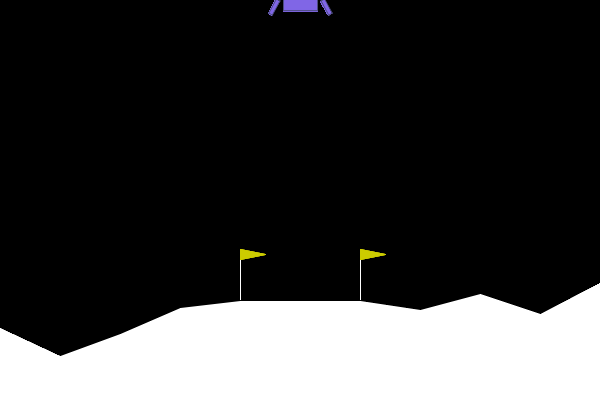

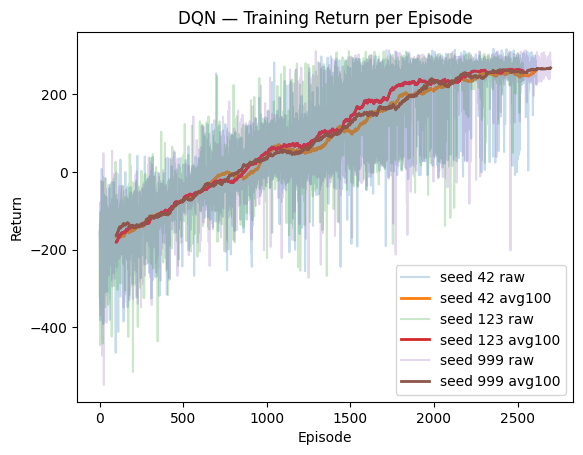

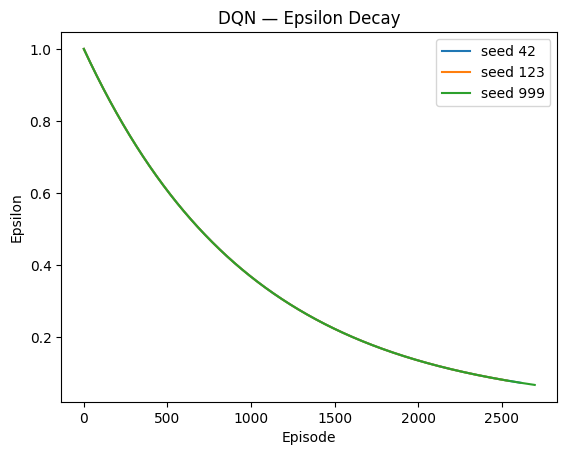

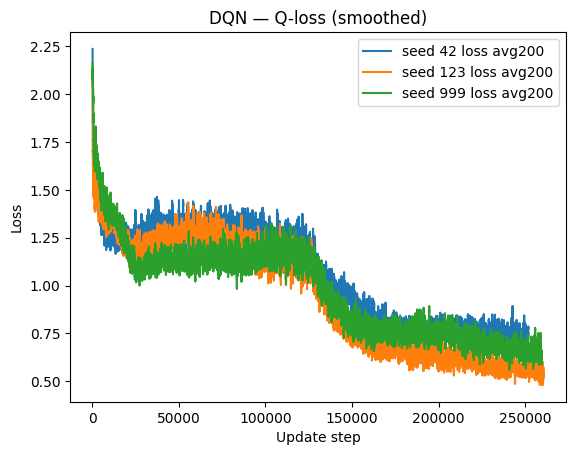

In [9]:
# 1) Tune
dqn_trials, best_dqn = mc_tune_dqn(n_trials=15, tune_seed=42, train_seed=42)
print("\nBEST CFG:", best_dqn["cfg"])

# 2) Final 3 seeds (fair comparison)
FINAL_SEEDS = [42, 123, 999]
final_cfg = dict(best_dqn["cfg"])
final_cfg["eval_episodes"] = 20
final_cfg["make_gif"] = False  # gifs só no melhor final

dqn_final = []
for s in FINAL_SEEDS:
    print("\n=== FINAL seed", s, "===")
    dqn_final.append(run_dqn(final_cfg, seed=s, run_name="dqn_final"))

means = [r["eval_mean"] for r in dqn_final]
print("\nFINAL mean across seeds:", float(np.mean(means)), "| std:", float(np.std(means, ddof=1)))

# 3) Pick best FINAL seed and generate GIF (1 run extra, só para gif)
best_seed = max(dqn_final, key=lambda x: x["eval_mean"])
gif_cfg = dict(final_cfg)
gif_cfg["make_gif"] = True
gif_run = run_dqn(gif_cfg, seed=best_seed["seed"], run_name="dqn_best_gif")

from IPython.display import Image, display
display(Image(filename=gif_run["center_gif_path"]))

# 4) Plots: returns + avg100, epsilon, loss (por seed)
def load_curves(path):
    d = np.load(path, allow_pickle=True)
    return {k: d[k] for k in d.files}

plt.figure()
for r in dqn_final:
    c = load_curves(r["curves_path"])
    y = c["returns"]
    plt.plot(y, alpha=0.25, label=f"seed {r['seed']} raw")
    plt.plot(moving_avg(y, 100), linewidth=2, label=f"seed {r['seed']} avg100")
plt.title("DQN — Training Return per Episode")
plt.xlabel("Episode"); plt.ylabel("Return"); plt.legend(); plt.show()

plt.figure()
for r in dqn_final:
    c = load_curves(r["curves_path"])
    plt.plot(c["eps"], label=f"seed {r['seed']}")
plt.title("DQN — Epsilon Decay")
plt.xlabel("Episode"); plt.ylabel("Epsilon"); plt.legend(); plt.show()

plt.figure()
for r in dqn_final:
    c = load_curves(r["curves_path"])
    if len(c["losses"]) > 0:
        plt.plot(moving_avg(c["losses"], 200), label=f"seed {r['seed']} loss avg200")
plt.title("DQN — Q-loss (smoothed)")
plt.xlabel("Update step"); plt.ylabel("Loss"); plt.legend(); plt.show()



# 9. SB3 DQN

In [1]:
# =========================
# Single Strong Runner: LunarLander-v3 (DQN vs PPO)
# =========================

import os
import random
import numpy as np
import gymnasium as gym

from stable_baselines3 import DQN, PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import EvalCallback
from stable_baselines3.common.evaluation import evaluate_policy

# Optional (recommended improvement for value-based baseline)
# pip install sb3-contrib
try:
    from sb3_contrib import QRDQN
    HAS_QRDQN = True
except Exception:
    HAS_QRDQN = False


# ---------- Reproducibility ----------
def set_global_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)


# ---------- Env builders ----------
ENV_ID = "LunarLander-v3"

def make_train_env(seed: int):
    # 1 env is enough for LunarLander; keep it simple/stable
    def _make():
        env = gym.make(ENV_ID)
        env = Monitor(env)
        env.reset(seed=seed)
        return env
    return make_vec_env(_make, n_envs=1, seed=seed)

def make_eval_env(seed: int):
    def _make():
        env = gym.make(ENV_ID)
        env = Monitor(env)
        env.reset(seed=seed)
        return env
    return make_vec_env(_make, n_envs=1, seed=seed)


# ---------- Algo builders ----------
def build_model(algo: str, env, seed: int, log_dir: str):
    algo = algo.upper()

    if algo in ["DQN", "QRDQN"]:
        # Strong DQN defaults for LunarLander:
        # - Exploration lasts longer
        # - Don't let eps go too low (avoid getting stuck)
        # - Conservative update ratio
        dqn_cls = DQN
        policy_kwargs = dict(net_arch=[256, 256])

        common_kwargs = dict(
            policy="MlpPolicy",
            env=env,
            learning_rate=2e-4,
            gamma=0.99,
            buffer_size=200_000,
            learning_starts=10_000,
            batch_size=64,
            tau=1.0,
            train_freq=4,
            gradient_steps=1,
            target_update_interval=1_000,
            exploration_initial_eps=1.0,
            exploration_final_eps=0.05,
            exploration_fraction=0.4,
            max_grad_norm=10.0,
            policy_kwargs=policy_kwargs,
            verbose=1,
            tensorboard_log=log_dir,
            seed=seed,
        )

        if algo == "QRDQN":
            if not HAS_QRDQN:
                raise RuntimeError("QRDQN requested but sb3-contrib is not installed. Install: pip install sb3-contrib")
            # QRDQN uses extra policy kwargs
            policy_kwargs = dict(net_arch=[256, 256], n_quantiles=50)
            common_kwargs["policy_kwargs"] = policy_kwargs
            return QRDQN(**common_kwargs)

        return dqn_cls(**common_kwargs)

    elif algo == "PPO":
        # Strong PPO defaults for LunarLander-v3:
        # Common stable choices: smaller lr, clip range, GAE, etc.
        policy_kwargs = dict(net_arch=[256, 256])

        return PPO(
            policy="MlpPolicy",
            env=env,
            learning_rate=3e-4,
            n_steps=2048,
            batch_size=64,
            n_epochs=10,
            gamma=0.99,
            gae_lambda=0.95,
            clip_range=0.2,
            ent_coef=0.0,      # you can try 0.01 if exploration is weak
            vf_coef=0.5,
            max_grad_norm=0.5,
            policy_kwargs=policy_kwargs,
            verbose=1,
            tensorboard_log=log_dir,
            seed=seed,
        )

    else:
        raise ValueError("algo must be one of: DQN, PPO, QRDQN")


# ---------- Main run ----------
def run_experiment(
    algo: str,
    total_timesteps: int = 1_000_000,
    seeds=(0, 1, 2),
    eval_episodes: int = 20,
    eval_freq: int = 50_000,
    root_dir: str = "runs_strong",
):
    os.makedirs(root_dir, exist_ok=True)
    results = []

    for seed in seeds:
        set_global_seed(seed)

        run_dir = os.path.join(root_dir, f"{algo}_seed{seed}")
        os.makedirs(run_dir, exist_ok=True)

        train_env = make_train_env(seed)
        eval_env = make_eval_env(seed + 10_000)

        best_dir = os.path.join(run_dir, "best_model")
        log_path = os.path.join(run_dir, "eval_logs")

        eval_cb = EvalCallback(
            eval_env,
            best_model_save_path=best_dir,
            log_path=log_path,
            eval_freq=eval_freq,       # evaluated every eval_freq env steps
            n_eval_episodes=eval_episodes,
            deterministic=True,
            render=False,
        )

        model = build_model(algo, train_env, seed=seed, log_dir=run_dir)

        model.learn(
            total_timesteps=total_timesteps,
            callback=eval_cb,
            log_interval=10,
            progress_bar=False,
        )

        # Load best model if exists, else evaluate final
        best_zip = os.path.join(best_dir, "best_model.zip")
        if os.path.exists(best_zip):
            model = model.load(best_zip, env=train_env)

        mean_r, std_r = evaluate_policy(
            model,
            eval_env,
            n_eval_episodes=eval_episodes,
            deterministic=True,
            render=False,
        )

        n_updates = int(getattr(model, "_n_updates", -1))

        model.save(os.path.join(run_dir, "final_model.zip"))
        train_env.close()
        eval_env.close()

        results.append(
            dict(
                algo=algo,
                seed=int(seed),
                eval_mean=float(mean_r),
                eval_std=float(std_r),
                n_updates=n_updates,
                run_dir=run_dir,
            )
        )

    # Aggregate
    means = np.array([r["eval_mean"] for r in results], dtype=float)
    summary = dict(
        algo=algo,
        seeds=list(seeds),
        mean_over_seeds=float(means.mean()),
        std_over_seeds=float(means.std(ddof=1)) if len(means) > 1 else 0.0,
        total_timesteps=int(total_timesteps),
        eval_episodes=int(eval_episodes),
    )

    return results, summary


# Example usage:
dqn_runs, dqn_summary = run_experiment("DQN", total_timesteps=2_500_000, seeds=(42,123,999))
ppo_runs, ppo_summary = run_experiment("PPO", total_timesteps=2_500_000, seeds=(42,123,999))
qrdqn_runs, qrdqn_summary = run_experiment("QRDQN", total_timesteps=1_500_000, seeds=(42,123,999))  # optional

Using cpu device
Logging to runs_strong\DQN_seed42\DQN_4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.7     |
|    ep_rew_mean      | -222     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 10       |
|    fps              | 18395    |
|    time_elapsed     | 0        |
|    total_timesteps  | 937      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 91.8     |
|    ep_rew_mean      | -181     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 20       |
|    fps              | 18396    |
|    time_elapsed     | 0        |
|    total_timesteps  | 1836     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 85.8     |
|    ep_rew_mean      | -170     |
|    exploration_rate | 0.998    

Using cpu device
Logging to runs_integrated\lunar_DQN_seed42\DQN_6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.7     |
|    ep_rew_mean      | -222     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 10       |
|    fps              | 17245    |
|    time_elapsed     | 0        |
|    total_timesteps  | 937      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 91.8     |
|    ep_rew_mean      | -181     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 20       |
|    fps              | 18764    |
|    time_elapsed     | 0        |
|    total_timesteps  | 1836     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 85.8     |
|    ep_rew_mean      | -170     |
|    exploration_rate |

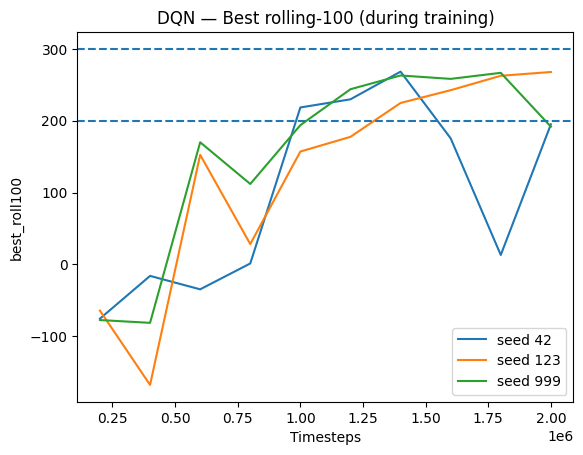

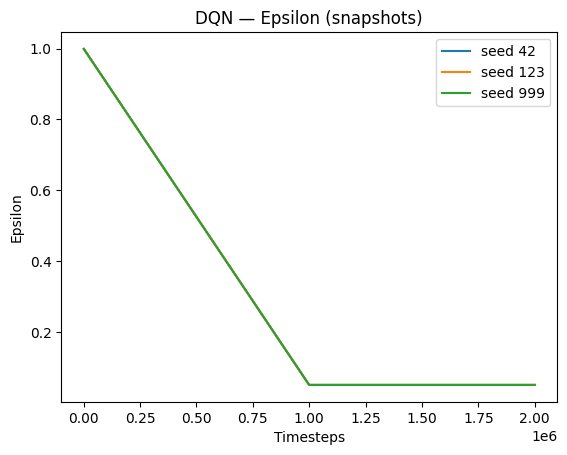

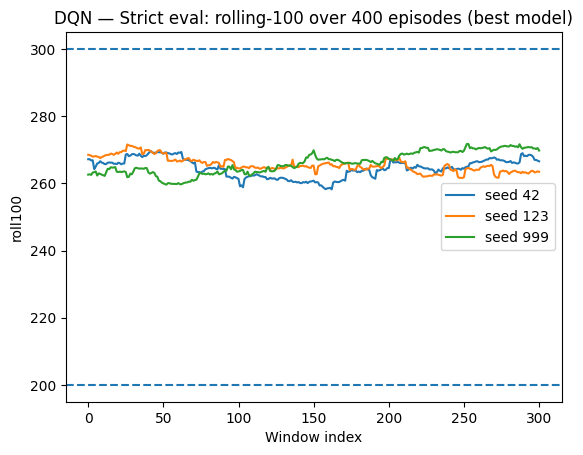

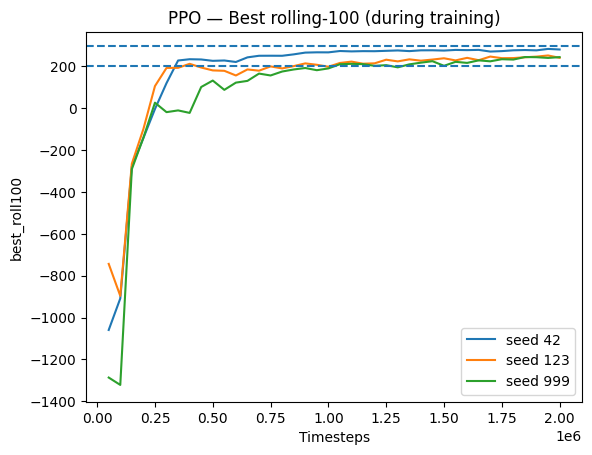

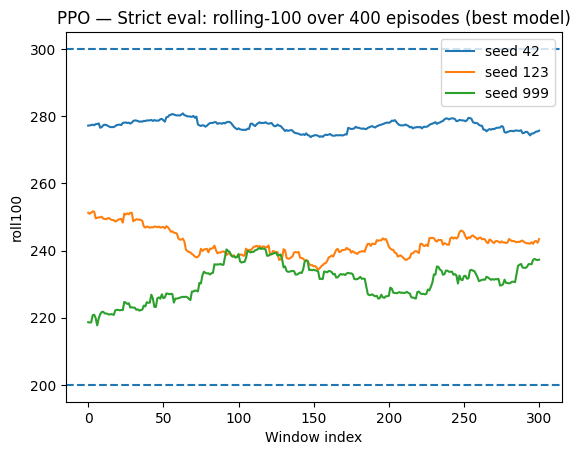


GIF saved at: runs_integrated\lunar_PPO_seed42\PPO_best_seed42.gif


In [2]:
# =========================
# ONE FILE / ONE PIPELINE (FULL + RICH QUICK-EVAL)
# LunarLander-v3 Benchmark (DQN vs PPO) with:
# - Windows-safe atomic checkpoints
# - Early & often checkpoints + best model + final model
# - Quick-eval (every X steps): mean/std + success_rate@200 + max/min + p50/p90
# - Strict criterion (final): exists a window of 100 consecutive episodes with mean >= 200
# - Extra strict metrics: best_roll100, final_roll100, success_rate_last100, max_ep_reward_400
# - Tables, plots, GIF (best across all runs)
# =========================

import os
import glob
import time
import json
import random
import numpy as np
import gymnasium as gym

from stable_baselines3 import DQN, PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import BaseCallback
from stable_baselines3.common.evaluation import evaluate_policy

# Optional stronger value-based baseline (if allowed)
# pip install sb3-contrib
try:
    from sb3_contrib import QRDQN
    HAS_QRDQN = True
except Exception:
    HAS_QRDQN = False


# --------------------------
# Reproducibility
# --------------------------
def set_global_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)


# --------------------------
# Paths
# --------------------------
ROOT_DIR = "runs_integrated"
os.makedirs(ROOT_DIR, exist_ok=True)


# --------------------------
# Atomic save helper (Windows-safe)
# --------------------------
def atomic_save_model(model, final_path: str):
    out_dir = os.path.dirname(final_path)
    if out_dir:
        os.makedirs(out_dir, exist_ok=True)

    tmp_base = final_path + f".tmp_{int(time.time() * 1e6)}"
    model.save(tmp_base)

    candidates = []
    if os.path.isfile(tmp_base + ".zip"):
        candidates.append(tmp_base + ".zip")
    if os.path.isfile(tmp_base):
        candidates.append(tmp_base)

    candidates.extend(glob.glob(tmp_base + "*.zip"))
    candidates = [c for c in candidates if os.path.isfile(c)]

    if not candidates:
        raise FileNotFoundError(
            f"SB3 save produced no file for tmp_base='{tmp_base}'. "
            f"Checked: {tmp_base}, {tmp_base+'.zip'}, {tmp_base+'*.zip'}"
        )

    tmp_file = max(candidates, key=os.path.getmtime)
    final_zip = final_path if final_path.endswith(".zip") else final_path + ".zip"

    os.replace(tmp_file, final_zip)

    # cleanup leftovers
    for c in candidates:
        if c != tmp_file and os.path.exists(c):
            try:
                os.remove(c)
            except Exception:
                pass

    return final_zip


# --------------------------
# Env builders
# --------------------------
ENV_ID = "LunarLander-v3"

def _make_env_fn(seed: int):
    def _make():
        env = gym.make(ENV_ID)
        env = Monitor(env)
        env.reset(seed=seed)
        return env
    return _make

def make_train_env(seed: int, n_envs: int):
    return make_vec_env(_make_env_fn(seed), n_envs=n_envs, seed=seed)

def make_eval_env(seed: int):
    return make_vec_env(_make_env_fn(seed), n_envs=1, seed=seed)


# --------------------------
# Rolling mean + strict criterion
# --------------------------
def moving_avg(x, w=100):
    x = np.asarray(x, dtype=float)
    if len(x) < w:
        return np.array([], dtype=float)
    return np.convolve(x, np.ones(w) / w, mode="valid")


def evaluate_consecutive_100(
    model,
    env_id: str,
    seed: int,
    n_episodes: int = 400,
    threshold: float = 200.0,
    window: int = 100
):
    """
    Deterministic run for n_episodes (consecutive episodes).
    Solved criterion: exists window=100 consecutive episodes with mean reward >= threshold.
    Extra:
      - max_ep_reward over n_episodes
      - success_rate_last100 (fraction of last 100 eps >= threshold)
    """
    env = gym.make(env_id)
    env.reset(seed=seed)

    ep_rewards = []
    for _ in range(n_episodes):
        obs, info = env.reset()
        done = False
        truncated = False
        total_r = 0.0
        while not (done or truncated):
            action, _ = model.predict(obs, deterministic=True)
            obs, r, done, truncated, info = env.step(action)
            total_r += float(r)
        ep_rewards.append(total_r)

    env.close()

    ep_rewards = np.asarray(ep_rewards, dtype=float)
    roll100 = moving_avg(ep_rewards, window)

    max_ep_reward = float(np.max(ep_rewards)) if len(ep_rewards) else float("nan")

    if len(roll100) == 0:
        return ep_rewards, roll100, False, None, float(ep_rewards.mean()), None, 0.0, max_ep_reward

    solved_mask = roll100 >= threshold
    solved = bool(np.any(solved_mask))
    first_idx = int(np.argmax(solved_mask)) if solved else None
    first_solved_episode = int(first_idx + window) if solved else None

    best_roll100 = float(np.max(roll100))
    final_roll100 = float(roll100[-1])

    last100 = ep_rewards[-window:]
    success_rate_last100 = float((last100 >= threshold).mean())

    return ep_rewards, roll100, solved, first_solved_episode, best_roll100, final_roll100, success_rate_last100, max_ep_reward


# --------------------------
# Quick eval with extra metrics
# --------------------------
def evaluate_policy_with_success(model, env, n_eval_episodes: int = 20, threshold: float = 200.0):
    """
    Deterministic evaluation that returns:
      mean, std, success_rate(thr), n_success, max, min, p50, p90
    """
    ep_rewards, ep_lengths = evaluate_policy(
        model,
        env,
        n_eval_episodes=n_eval_episodes,
        deterministic=True,
        render=False,
        return_episode_rewards=True,
    )
    ep_rewards = np.asarray(ep_rewards, dtype=float)

    mean_r = float(ep_rewards.mean()) if len(ep_rewards) else float("nan")
    std_r = float(ep_rewards.std(ddof=1)) if len(ep_rewards) > 1 else 0.0

    n_success = int((ep_rewards >= threshold).sum())
    success_rate = float(n_success / len(ep_rewards)) if len(ep_rewards) else 0.0

    max_r = float(np.max(ep_rewards)) if len(ep_rewards) else float("nan")
    min_r = float(np.min(ep_rewards)) if len(ep_rewards) else float("nan")
    p50 = float(np.percentile(ep_rewards, 50)) if len(ep_rewards) else float("nan")
    p90 = float(np.percentile(ep_rewards, 90)) if len(ep_rewards) else float("nan")

    return dict(
        mean=mean_r,
        std=std_r,
        success_rate=success_rate,
        n_success=n_success,
        max=max_r,
        min=min_r,
        p50=p50,
        p90=p90,
    )


# --------------------------
# GIF maker
# --------------------------
def make_gif_from_model(model, path_gif: str, env_id: str, seed: int, fps: int = 30):
    import imageio
    env = gym.make(env_id, render_mode="rgb_array")
    obs, info = env.reset(seed=seed)

    frames = []
    done = False
    truncated = False
    while not (done or truncated):
        frames.append(env.render())
        action, _ = model.predict(obs, deterministic=True)
        obs, r, done, truncated, info = env.step(action)

    frames.append(env.render())
    env.close()

    os.makedirs(os.path.dirname(path_gif), exist_ok=True)
    imageio.mimsave(path_gif, frames, fps=fps)
    return path_gif


# --------------------------
# Model builders
# --------------------------
def build_model(algo: str, env, seed: int, log_dir: str):
    algo = algo.upper()

    if algo in ["DQN", "QRDQN"]:
        common_kwargs = dict(
            policy="MlpPolicy",
            env=env,
            learning_rate=1e-4,
            gamma=0.99,
            buffer_size=500_000,
            learning_starts=20_000,
            batch_size=128,
            tau=1.0,
            train_freq=4,
            gradient_steps=1,
            target_update_interval=2_000,
            exploration_initial_eps=1.0,
            exploration_final_eps=0.05,
            exploration_fraction=0.5,
            max_grad_norm=10.0,
            policy_kwargs=dict(net_arch=[256, 256]),
            verbose=1,
            tensorboard_log=log_dir,
            seed=seed,
            device="auto",
        )

        if algo == "QRDQN":
            if not HAS_QRDQN:
                raise RuntimeError("QRDQN requested but sb3-contrib not installed. pip install sb3-contrib")
            common_kwargs["policy_kwargs"] = dict(net_arch=[256, 256], n_quantiles=100)
            return QRDQN(**common_kwargs)

        return DQN(**common_kwargs)

    if algo == "PPO":
        return PPO(
            policy="MlpPolicy",
            env=env,
            learning_rate=2.5e-4,
            n_steps=1024,
            batch_size=256,
            n_epochs=10,
            gamma=0.99,
            gae_lambda=0.95,
            clip_range=0.2,
            ent_coef=0.01,
            vf_coef=0.5,
            max_grad_norm=0.5,
            policy_kwargs=dict(net_arch=[256, 256]),
            verbose=1,
            tensorboard_log=log_dir,
            seed=seed,
            device="auto",
        )

    raise ValueError("algo must be one of: DQN, PPO, QRDQN")


# --------------------------
# Callback: checkpoints + rich quick-eval + consec eval (heavier)
# --------------------------
class SafeEvalCheckpointCallback(BaseCallback):
    def __init__(
        self,
        run_dir: str,
        algo: str,
        eval_env,
        seed: int,
        total_timesteps: int,

        checkpoint_freq_steps: int = 50_000,

        quick_eval_freq_steps: int = 25_000,
        quick_eval_episodes: int = 20,
        quick_eval_threshold: float = 200.0,

        consec_eval_freq_steps: int = 200_000,
        consec_eval_episodes: int = 200,
        threshold: float = 200.0,
        window: int = 100,
        best_target: float = 300.0,

        verbose: int = 1
    ):
        super().__init__(verbose)
        self.run_dir = run_dir
        self.algo = algo
        self.eval_env = eval_env
        self.seed = seed
        self.total_timesteps = total_timesteps

        self.checkpoint_freq_steps = int(checkpoint_freq_steps)

        self.quick_eval_freq_steps = int(quick_eval_freq_steps)
        self.quick_eval_episodes = int(quick_eval_episodes)
        self.quick_eval_threshold = float(quick_eval_threshold)

        self.consec_eval_freq_steps = int(consec_eval_freq_steps)
        self.consec_eval_episodes = int(consec_eval_episodes)
        self.threshold = float(threshold)
        self.window = int(window)

        self.best_target = float(best_target)

        self.best_metric = -np.inf
        self.best_step = 0
        self.best_path = None

        self.log_jsonl = os.path.join(run_dir, "events.jsonl")

        self.train_steps = []
        self.train_eps = []
        self.train_loss = []

        # rich quick eval curves
        self.quick_eval_steps = []
        self.quick_eval_mean = []
        self.quick_eval_std = []
        self.quick_eval_success = []
        self.quick_eval_nsuccess = []
        self.quick_eval_max = []
        self.quick_eval_min = []
        self.quick_eval_p50 = []
        self.quick_eval_p90 = []

        # consec eval curves
        self.consec_eval_steps = []
        self.consec_best_roll100 = []
        self.consec_final_roll100 = []
        self.consec_solved = []
        self.consec_success_last100 = []

        self.ckpt_dir = os.path.join(run_dir, "checkpoints")
        os.makedirs(self.ckpt_dir, exist_ok=True)
        os.makedirs(run_dir, exist_ok=True)

    def _log_event(self, payload: dict):
        payload = dict(payload)
        payload["timestep"] = int(self.num_timesteps)
        payload["time"] = time.time()
        with open(self.log_jsonl, "a", encoding="utf-8") as f:
            f.write(json.dumps(payload) + "\n")

    def _on_step(self) -> bool:
        t = int(self.num_timesteps)

        # snapshots
        if t > 0 and (t % 1000) == 0:
            self.train_steps.append(t)
            eps = float(getattr(self.model, "exploration_rate", np.nan))
            self.train_eps.append(eps)
            try:
                loss_val = self.model.logger.name_to_value.get("train/loss", np.nan)
            except Exception:
                loss_val = np.nan
            self.train_loss.append(float(loss_val) if loss_val is not None else np.nan)

        # checkpoint
        if t > 0 and (t % self.checkpoint_freq_steps) == 0:
            ckpt_path = os.path.join(self.ckpt_dir, f"ckpt_{t}")
            final_zip = atomic_save_model(self.model, ckpt_path)
            print(f"[{self.algo}] checkpoint saved: {final_zip}")
            self._log_event({"type": "checkpoint", "path": final_zip})

        # rich quick eval
        if t > 0 and (t % self.quick_eval_freq_steps) == 0:
            q = evaluate_policy_with_success(
                self.model,
                self.eval_env,
                n_eval_episodes=self.quick_eval_episodes,
                threshold=self.quick_eval_threshold
            )

            self.quick_eval_steps.append(t)
            self.quick_eval_mean.append(q["mean"])
            self.quick_eval_std.append(q["std"])
            self.quick_eval_success.append(q["success_rate"])
            self.quick_eval_nsuccess.append(q["n_success"])
            self.quick_eval_max.append(q["max"])
            self.quick_eval_min.append(q["min"])
            self.quick_eval_p50.append(q["p50"])
            self.quick_eval_p90.append(q["p90"])

            print(
                f"[{self.algo}] quick-eval@{t}: "
                f"mean={q['mean']:.1f} std={q['std']:.1f} | "
                f"succ@{int(self.quick_eval_threshold)}={100*q['success_rate']:.1f}% ({q['n_success']}/{self.quick_eval_episodes}) | "
                f"max={q['max']:.1f} p90={q['p90']:.1f} p50={q['p50']:.1f} min={q['min']:.1f}"
            )

            self._log_event({"type": "quick_eval", **q})

        # consec eval (heavier)
        if t > 0 and (t % self.consec_eval_freq_steps) == 0:
            ep_r, roll100, solved, first_solved_ep, best_roll100, final_roll100, success_rate_last100, max_ep_reward = evaluate_consecutive_100(
                self.model,
                env_id=ENV_ID,
                seed=self.seed + 20_000 + t,
                n_episodes=self.consec_eval_episodes,
                threshold=self.threshold,
                window=self.window
            )

            self.consec_eval_steps.append(t)
            self.consec_best_roll100.append(best_roll100)
            self.consec_final_roll100.append(final_roll100 if final_roll100 is not None else np.nan)
            self.consec_solved.append(int(solved))
            self.consec_success_last100.append(success_rate_last100)

            print(
                f"[{self.algo}] consec100@{t}: "
                f"best_roll100={best_roll100:.1f} final_roll100={final_roll100:.1f} "
                f"solved={solved} succ(last100)={100*success_rate_last100:.1f}% max_ep={max_ep_reward:.1f}"
            )

            self._log_event({
                "type": "consec100_eval",
                "best_roll100": best_roll100,
                "final_roll100": final_roll100,
                "solved": solved,
                "success_rate_last100": success_rate_last100,
                "max_ep_reward": max_ep_reward,
            })

            # BEST by best_roll100
            if best_roll100 > self.best_metric:
                self.best_metric = best_roll100
                self.best_step = t

                best_dir = os.path.join(self.run_dir, "best_model")
                os.makedirs(best_dir, exist_ok=True)
                best_zip = atomic_save_model(self.model, os.path.join(best_dir, "best_model"))
                self.best_path = best_zip

                print(f"[{self.algo}] NEW BEST saved: {best_zip} (best_roll100={best_roll100:.1f})")
                self._log_event({"type": "best_saved", "metric": best_roll100, "path": best_zip})

                if best_roll100 >= self.best_target:
                    print(f"[{self.algo}] Target reached (best_roll100 >= {self.best_target:.0f}). Early stop.")
                    return False

        return True

    def _on_training_end(self) -> None:
        curves_path = os.path.join(self.run_dir, "curves.npz")
        np.savez_compressed(
            curves_path,

            train_steps=np.asarray(self.train_steps, dtype=np.int64),
            eps=np.asarray(self.train_eps, dtype=np.float32),
            losses=np.asarray(self.train_loss, dtype=np.float32),

            quick_eval_steps=np.asarray(self.quick_eval_steps, dtype=np.int64),
            quick_eval_mean=np.asarray(self.quick_eval_mean, dtype=np.float32),
            quick_eval_std=np.asarray(self.quick_eval_std, dtype=np.float32),
            quick_eval_success=np.asarray(self.quick_eval_success, dtype=np.float32),
            quick_eval_nsuccess=np.asarray(self.quick_eval_nsuccess, dtype=np.int32),
            quick_eval_max=np.asarray(self.quick_eval_max, dtype=np.float32),
            quick_eval_min=np.asarray(self.quick_eval_min, dtype=np.float32),
            quick_eval_p50=np.asarray(self.quick_eval_p50, dtype=np.float32),
            quick_eval_p90=np.asarray(self.quick_eval_p90, dtype=np.float32),

            consec_eval_steps=np.asarray(self.consec_eval_steps, dtype=np.int64),
            consec_best_roll100=np.asarray(self.consec_best_roll100, dtype=np.float32),
            consec_final_roll100=np.asarray(self.consec_final_roll100, dtype=np.float32),
            consec_solved=np.asarray(self.consec_solved, dtype=np.int8),
            consec_success_last100=np.asarray(self.consec_success_last100, dtype=np.float32),
        )
        print(f"[{self.algo}] curves saved: {curves_path}")

        info = dict(
            algo=self.algo,
            seed=int(self.seed),
            best_metric=float(self.best_metric),
            best_step=int(self.best_step),
            best_model_path=self.best_path,
            curves_path=curves_path,
        )
        with open(os.path.join(self.run_dir, "best_info.json"), "w", encoding="utf-8") as f:
            json.dump(info, f, indent=2)


# --------------------------
# Run one seed (one algo)
# --------------------------
def run_one(
    algo: str,
    seed: int,
    total_timesteps: int,
    run_name: str,
    ppo_train_envs: int = 16,

    checkpoint_freq_steps: int = 50_000,

    quick_eval_freq_steps: int = 25_000,
    quick_eval_episodes: int = 20,
    quick_eval_threshold: float = 200.0,

    consec_eval_freq_steps: int = 200_000,
    consec_eval_episodes: int = 200,

    threshold: float = 200.0,
    window: int = 100,
    best_target: float = 300.0,
):
    algo_up = algo.upper()
    set_global_seed(seed)

    run_dir = os.path.join(ROOT_DIR, f"{run_name}_{algo_up}_seed{seed}")
    os.makedirs(run_dir, exist_ok=True)

    n_envs = ppo_train_envs if algo_up == "PPO" else 1
    train_env = make_train_env(seed, n_envs=n_envs)
    eval_env = make_eval_env(seed + 10_000)

    # convert to vec frequency
    eff_checkpoint = max(checkpoint_freq_steps // train_env.num_envs, 1)
    eff_quick = max(quick_eval_freq_steps // train_env.num_envs, 1)
    eff_consec = max(consec_eval_freq_steps // train_env.num_envs, 1)

    model = build_model(algo_up, train_env, seed=seed, log_dir=run_dir)

    cb = SafeEvalCheckpointCallback(
        run_dir=run_dir,
        algo=algo_up,
        eval_env=eval_env,
        seed=seed,
        total_timesteps=total_timesteps,

        checkpoint_freq_steps=eff_checkpoint,

        quick_eval_freq_steps=eff_quick,
        quick_eval_episodes=quick_eval_episodes,
        quick_eval_threshold=quick_eval_threshold,

        consec_eval_freq_steps=eff_consec,
        consec_eval_episodes=consec_eval_episodes,

        threshold=threshold,
        window=window,
        best_target=best_target,
        verbose=1
    )

    try:
        model.learn(total_timesteps=total_timesteps, callback=cb, log_interval=10, progress_bar=False)
    finally:
        final_zip = atomic_save_model(model, os.path.join(run_dir, "final_model"))
        train_env.close()
        eval_env.close()

    # load best model if exists
    best_zip = cb.best_path
    if best_zip and os.path.exists(best_zip):
        if algo_up == "PPO":
            best_model = PPO.load(best_zip, device="auto")
        elif algo_up == "DQN":
            best_model = DQN.load(best_zip, device="auto")
        else:
            best_model = QRDQN.load(best_zip, device="auto")
    else:
        best_model = model

    # FINAL strict eval 400 eps (official)
    ep_r, roll100, solved, first_solved_ep, best_roll100, final_roll100, success_rate_last100, max_ep_reward_400 = evaluate_consecutive_100(
        best_model, env_id=ENV_ID, seed=seed + 99_999, n_episodes=400, threshold=threshold, window=window
    )

    # quick final 20 eps metrics
    eval_env2 = make_eval_env(seed + 88_888)
    qfinal = evaluate_policy_with_success(best_model, eval_env2, n_eval_episodes=20, threshold=threshold)
    eval_env2.close()

    summary = dict(
        algo=algo_up,
        seed=int(seed),
        run_dir=run_dir,

        final_model_path=final_zip,
        best_model_path=best_zip,

        quick20_mean=float(qfinal["mean"]),
        quick20_std=float(qfinal["std"]),
        quick20_success_rate=float(qfinal["success_rate"]),
        quick20_nsuccess=int(qfinal["n_success"]),
        quick20_max=float(qfinal["max"]),
        quick20_p90=float(qfinal["p90"]),
        quick20_p50=float(qfinal["p50"]),

        solved_consecutive_100=bool(solved),
        first_solved_episode=int(first_solved_ep) if first_solved_ep is not None else None,

        best_roll100=float(best_roll100),
        final_roll100=float(final_roll100),
        success_rate_last100=float(success_rate_last100),
        max_ep_reward_400=float(max_ep_reward_400),
    )

    np.savez_compressed(
        os.path.join(run_dir, "strict_eval_400eps.npz"),
        ep_rewards=ep_r.astype(np.float32),
        roll100=roll100.astype(np.float32) if len(roll100) else np.array([], dtype=np.float32),
    )

    with open(os.path.join(run_dir, "final_summary.json"), "w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2)

    return summary


# --------------------------
# Benchmark many seeds
# --------------------------
def run_benchmark(algo: str, seeds=(42, 123, 999), total_timesteps: int = 1_000_000, run_name: str = "bench"):
    return [run_one(algo=algo, seed=s, total_timesteps=total_timesteps, run_name=run_name) for s in seeds]


# --------------------------
# Tables + plots + GIF
# --------------------------
def print_table(runs, title: str):
    import pandas as pd
    df = pd.DataFrame(runs).copy()
    df["solved@200(100)"] = df["solved_consecutive_100"].astype(bool)
    df["great@300(100)"] = df["best_roll100"] >= 300.0
    cols = [
        "algo","seed",
        "quick20_mean","quick20_std","quick20_success_rate","quick20_max","quick20_p90","quick20_p50",
        "solved@200(100)","first_solved_episode",
        "best_roll100","final_roll100","success_rate_last100","max_ep_reward_400",
        "great@300(100)","run_dir"
    ]
    df = df[cols].sort_values(["best_roll100"], ascending=False)
    print(f"\n=== {title} ===")
    print(df.to_string(index=False))
    return df

def load_npz(path):
    d = np.load(path, allow_pickle=True)
    return {k: d[k] for k in d.files}

def plot_all(runs, title_prefix: str):
    import matplotlib.pyplot as plt

    # best_roll100 during training
    plt.figure()
    for r in runs:
        c = load_npz(os.path.join(r["run_dir"], "curves.npz"))
        x = c["consec_eval_steps"]
        y = c["consec_best_roll100"]
        if len(x) > 0:
            plt.plot(x, y, label=f"seed {r['seed']}")
    plt.axhline(200, linestyle="--")
    plt.axhline(300, linestyle="--")
    plt.title(f"{title_prefix} — Best rolling-100 (during training)")
    plt.xlabel("Timesteps"); plt.ylabel("best_roll100"); plt.legend(); plt.show()

    # epsilon (DQN only)
    plt.figure()
    any_line = False
    for r in runs:
        c = load_npz(os.path.join(r["run_dir"], "curves.npz"))
        x = c["train_steps"]
        eps = c["eps"]
        if len(x) > 0 and len(eps) > 0 and not np.all(np.isnan(eps)):
            plt.plot(x, eps, label=f"seed {r['seed']}")
            any_line = True
    if any_line:
        plt.title(f"{title_prefix} — Epsilon (snapshots)")
        plt.xlabel("Timesteps"); plt.ylabel("Epsilon"); plt.legend(); plt.show()
    else:
        plt.close()

    # strict eval roll100
    plt.figure()
    for r in runs:
        strict = load_npz(os.path.join(r["run_dir"], "strict_eval_400eps.npz"))
        roll = strict["roll100"]
        if len(roll) > 0:
            plt.plot(roll, label=f"seed {r['seed']}")
    plt.axhline(200, linestyle="--")
    plt.axhline(300, linestyle="--")
    plt.title(f"{title_prefix} — Strict eval: rolling-100 over 400 episodes (best model)")
    plt.xlabel("Window index"); plt.ylabel("roll100"); plt.legend(); plt.show()

def pick_best_run(runs):
    return max(runs, key=lambda r: (r["best_roll100"], r["final_roll100"], r["quick20_mean"]))

def generate_best_gif(best_run, fps: int = 30):
    algo = best_run["algo"]
    seed = best_run["seed"]
    best_zip = best_run["best_model_path"] or best_run["final_model_path"]

    if algo == "PPO":
        model = PPO.load(best_zip, device="auto")
    elif algo == "DQN":
        model = DQN.load(best_zip, device="auto")
    else:
        model = QRDQN.load(best_zip, device="auto")

    gif_path = os.path.join(best_run["run_dir"], f"{algo}_best_seed{seed}.gif")
    make_gif_from_model(model, gif_path, env_id=ENV_ID, seed=seed + 777_777, fps=fps)
    return gif_path


# --------------------------
# USAGE
# --------------------------
if __name__ == "__main__":
    seeds = (42, 123, 999)

    # If you want faster first pass:
    #   PPO: 2_000_000
    #   DQN: 2_000_000
    ppo_steps = 2_000_000
    dqn_steps = 2_000_000

    dqn_runs = run_benchmark("DQN", seeds=seeds, total_timesteps=dqn_steps, run_name="lunar")
    ppo_runs = run_benchmark("PPO", seeds=seeds, total_timesteps=ppo_steps, run_name="lunar")

    dqn_df = print_table(dqn_runs, "DQN RESULTS")
    ppo_df = print_table(ppo_runs, "PPO RESULTS")

    plot_all(dqn_runs, "DQN")
    plot_all(ppo_runs, "PPO")

    best_all = pick_best_run(dqn_runs + ppo_runs)
    gif_path = generate_best_gif(best_all, fps=30)
    print("\nGIF saved at:", gif_path)

Using cpu device
Logging to runs_integrated\lunar_DQN_seed42\DQN_7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.7     |
|    ep_rew_mean      | -222     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 10       |
|    fps              | 20002    |
|    time_elapsed     | 0        |
|    total_timesteps  | 937      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 91.8     |
|    ep_rew_mean      | -181     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 20       |
|    fps              | 20320    |
|    time_elapsed     | 0        |
|    total_timesteps  | 1836     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 85.8     |
|    ep_rew_mean      | -170     |
|    exploration_rate |

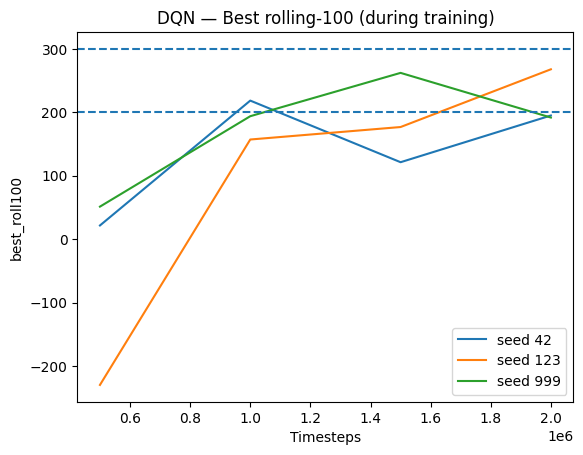

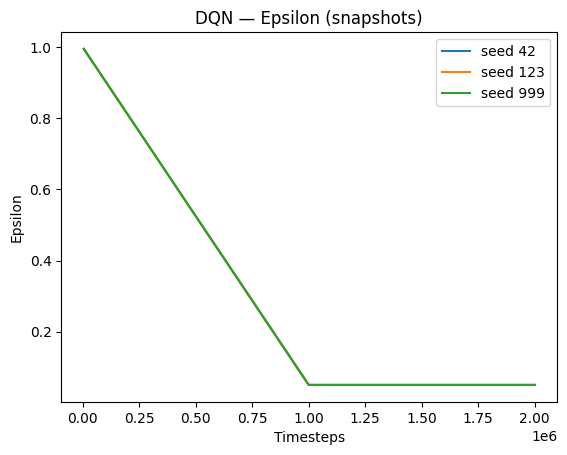

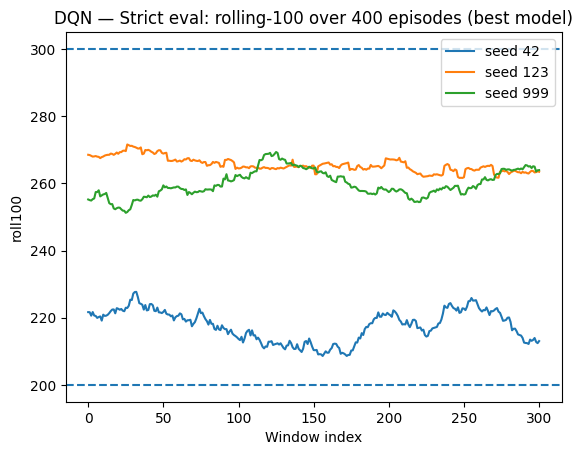

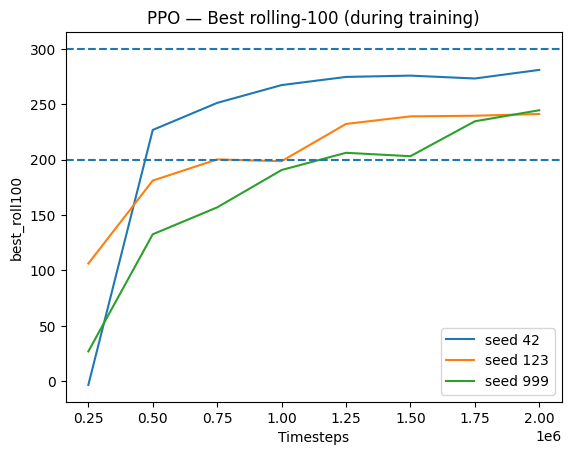

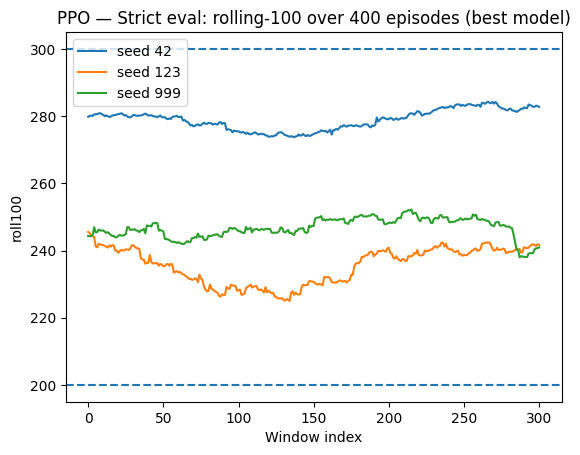


===== GLOBAL SUMMARY (across seeds) =====
DQN: quick20_mean avg=251.9 (std_across_seeds=26.9), quick20_std avg=45.0 | best_roll100 avg=256.2 (std_across_seeds=24.7)
  BEST DQN seed=123 | best_roll100=271.6 | quick20_mean=274.2 std=31.8 | solved=True first_end_ep=100 | best_window_min=63.8 | run_dir=runs_integrated\lunar_DQN_seed123
PPO: quick20_mean avg=248.3 (std_across_seeds=23.1), quick20_std avg=49.5 | best_roll100 avg=260.7 (std_across_seeds=20.7)
  BEST PPO seed=42 | best_roll100=284.3 | quick20_mean=274.5 std=24.1 | solved=True first_end_ep=100 | best_window_min=169.2 | run_dir=runs_integrated\lunar_PPO_seed42

BEST OVERALL RUN:
  algo=PPO seed=42 | best_roll100=284.3 | quick20_mean=274.5 std=24.1 | solved=True first_end_ep=100 | best_window_min=169.2 | run_dir=runs_integrated\lunar_PPO_seed42

GIF saved at: runs_integrated\lunar_PPO_seed42\PPO_best_seed42.gif


In [3]:
# =========================
# ONE FILE / ONE PIPELINE (FULL + VERIFIED CONSECUTIVE CRITERION + GLOBAL SUMMARY)
# LunarLander-v3 Benchmark (DQN vs PPO) with:
# - Windows-safe atomic checkpoints
# - Early & spaced checkpoints + best model + final model
# - Rich quick-eval: mean/std + success_rate@200 + max/min + p50/p90
# - Strict criterion (final): exists a window of 100 consecutive episodes with mean >= 200
# - Strict proof metrics: first_solved_end_ep, best_window_start, best_window_min
# - Extra strict metrics: best_roll100, final_roll100, success_rate_last100, max_ep_reward_400
# - Tables, plots, GIF (best across all runs)
# =========================

import os
import glob
import time
import json
import random
import numpy as np
import gymnasium as gym

from stable_baselines3 import DQN, PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import BaseCallback
from stable_baselines3.common.evaluation import evaluate_policy

# Optional stronger value-based baseline (if allowed)
# pip install sb3-contrib
try:
    from sb3_contrib import QRDQN
    HAS_QRDQN = True
except Exception:
    HAS_QRDQN = False


# --------------------------
# Reproducibility
# --------------------------
def set_global_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)


# --------------------------
# Paths
# --------------------------
ROOT_DIR = "runs_integrated"
os.makedirs(ROOT_DIR, exist_ok=True)


# --------------------------
# Atomic save helper (Windows-safe)
# --------------------------
def atomic_save_model(model, final_path: str):
    out_dir = os.path.dirname(final_path)
    if out_dir:
        os.makedirs(out_dir, exist_ok=True)

    tmp_base = final_path + f".tmp_{int(time.time() * 1e6)}"
    model.save(tmp_base)

    candidates = []
    if os.path.isfile(tmp_base + ".zip"):
        candidates.append(tmp_base + ".zip")
    if os.path.isfile(tmp_base):
        candidates.append(tmp_base)

    candidates.extend(glob.glob(tmp_base + "*.zip"))
    candidates = [c for c in candidates if os.path.isfile(c)]

    if not candidates:
        raise FileNotFoundError(
            f"SB3 save produced no file for tmp_base='{tmp_base}'. "
            f"Checked: {tmp_base}, {tmp_base+'.zip'}, {tmp_base+'*.zip'}"
        )

    tmp_file = max(candidates, key=os.path.getmtime)
    final_zip = final_path if final_path.endswith(".zip") else final_path + ".zip"

    os.replace(tmp_file, final_zip)

    # cleanup leftovers
    for c in candidates:
        if c != tmp_file and os.path.exists(c):
            try:
                os.remove(c)
            except Exception:
                pass

    return final_zip


# --------------------------
# Env builders
# --------------------------
ENV_ID = "LunarLander-v3"

def _make_env_fn(seed: int):
    def _make():
        env = gym.make(ENV_ID)
        env = Monitor(env)
        env.reset(seed=seed)
        return env
    return _make

def make_train_env(seed: int, n_envs: int):
    return make_vec_env(_make_env_fn(seed), n_envs=n_envs, seed=seed)

def make_eval_env(seed: int):
    return make_vec_env(_make_env_fn(seed), n_envs=1, seed=seed)


# --------------------------
# Rolling mean
# --------------------------
def moving_avg(x, w=100):
    x = np.asarray(x, dtype=float)
    if len(x) < w:
        return np.array([], dtype=float)
    return np.convolve(x, np.ones(w) / w, mode="valid")


# --------------------------
# STRICT evaluation with VERIFIED "100 consecutive" criterion
# --------------------------
def evaluate_consecutive_100(
    model,
    env_id: str,
    seed: int,
    n_episodes: int = 400,
    threshold: float = 200.0,
    window: int = 100
):
    """
    Deterministic run for n_episodes (consecutive episodes).
    Solved criterion: exists window=100 consecutive episodes with mean reward >= threshold.

    Returns dict with proof fields:
      - first_solved_end_ep: episode index where the first solved-window ends (1..n_episodes) or None
      - best_window_start: 1-indexed start episode of best rolling-100 window
      - best_window_min: minimum episode reward inside best rolling-100 window
    """
    env = gym.make(env_id)
    env.reset(seed=seed)

    ep_rewards = []
    for _ in range(n_episodes):
        obs, info = env.reset()
        done = False
        truncated = False
        total_r = 0.0
        while not (done or truncated):
            action, _ = model.predict(obs, deterministic=True)
            obs, r, done, truncated, info = env.step(action)
            total_r += float(r)
        ep_rewards.append(total_r)

    env.close()

    ep_rewards = np.asarray(ep_rewards, dtype=float)
    roll = moving_avg(ep_rewards, window)

    max_ep_reward = float(np.max(ep_rewards)) if len(ep_rewards) else float("nan")

    if len(roll) == 0:
        return dict(
            ep_rewards=ep_rewards,
            roll100=roll,
            solved=False,
            first_solved_end_ep=None,
            best_roll100=float(ep_rewards.mean()) if len(ep_rewards) else float("nan"),
            final_roll100=None,
            success_rate_last100=0.0,
            max_ep_reward=max_ep_reward,
            best_window_start=None,
            best_window_min=None,
        )

    solved_mask = roll >= threshold
    solved = bool(np.any(solved_mask))

    first_idx = int(np.argmax(solved_mask)) if solved else None
    first_solved_end_ep = int(first_idx + window) if solved else None

    best_idx = int(np.argmax(roll))
    best_roll100 = float(roll[best_idx])
    final_roll100 = float(roll[-1])

    best_window_rewards = ep_rewards[best_idx:best_idx + window]
    best_window_min = float(np.min(best_window_rewards))

    last100 = ep_rewards[-window:]
    success_rate_last100 = float((last100 >= threshold).mean())

    return dict(
        ep_rewards=ep_rewards,
        roll100=roll,
        solved=solved,
        first_solved_end_ep=first_solved_end_ep,
        best_roll100=best_roll100,
        final_roll100=final_roll100,
        success_rate_last100=success_rate_last100,
        max_ep_reward=max_ep_reward,
        best_window_start=int(best_idx + 1),   # 1-indexed
        best_window_min=best_window_min,
    )


# --------------------------
# Quick eval with extra metrics
# --------------------------
def evaluate_policy_with_success(model, env, n_eval_episodes: int = 20, threshold: float = 200.0):
    ep_rewards, ep_lengths = evaluate_policy(
        model,
        env,
        n_eval_episodes=n_eval_episodes,
        deterministic=True,
        render=False,
        return_episode_rewards=True,
    )
    ep_rewards = np.asarray(ep_rewards, dtype=float)

    mean_r = float(ep_rewards.mean()) if len(ep_rewards) else float("nan")
    std_r = float(ep_rewards.std(ddof=1)) if len(ep_rewards) > 1 else 0.0

    n_success = int((ep_rewards >= threshold).sum())
    success_rate = float(n_success / len(ep_rewards)) if len(ep_rewards) else 0.0

    max_r = float(np.max(ep_rewards)) if len(ep_rewards) else float("nan")
    min_r = float(np.min(ep_rewards)) if len(ep_rewards) else float("nan")
    p50 = float(np.percentile(ep_rewards, 50)) if len(ep_rewards) else float("nan")
    p90 = float(np.percentile(ep_rewards, 90)) if len(ep_rewards) else float("nan")

    return dict(
        mean=mean_r,
        std=std_r,
        success_rate=success_rate,
        n_success=n_success,
        max=max_r,
        min=min_r,
        p50=p50,
        p90=p90,
    )


# --------------------------
# GIF maker
# --------------------------
def make_gif_from_model(model, path_gif: str, env_id: str, seed: int, fps: int = 30):
    import imageio
    env = gym.make(env_id, render_mode="rgb_array")
    obs, info = env.reset(seed=seed)

    frames = []
    done = False
    truncated = False
    while not (done or truncated):
        frames.append(env.render())
        action, _ = model.predict(obs, deterministic=True)
        obs, r, done, truncated, info = env.step(action)

    frames.append(env.render())
    env.close()

    os.makedirs(os.path.dirname(path_gif), exist_ok=True)
    imageio.mimsave(path_gif, frames, fps=fps)
    return path_gif


# --------------------------
# Model builders
# --------------------------
def build_model(algo: str, env, seed: int, log_dir: str):
    algo = algo.upper()

    if algo in ["DQN", "QRDQN"]:
        common_kwargs = dict(
            policy="MlpPolicy",
            env=env,
            learning_rate=1e-4,
            gamma=0.99,
            buffer_size=500_000,
            learning_starts=20_000,
            batch_size=128,
            tau=1.0,
            train_freq=4,
            gradient_steps=1,
            target_update_interval=2_000,
            exploration_initial_eps=1.0,
            exploration_final_eps=0.05,
            exploration_fraction=0.5,
            max_grad_norm=10.0,
            policy_kwargs=dict(net_arch=[256, 256]),
            verbose=1,
            tensorboard_log=log_dir,
            seed=seed,
            device="auto",
        )

        if algo == "QRDQN":
            if not HAS_QRDQN:
                raise RuntimeError("QRDQN requested but sb3-contrib not installed. pip install sb3-contrib")
            common_kwargs["policy_kwargs"] = dict(net_arch=[256, 256], n_quantiles=100)
            return QRDQN(**common_kwargs)

        return DQN(**common_kwargs)

    if algo == "PPO":
        return PPO(
            policy="MlpPolicy",
            env=env,
            learning_rate=2.5e-4,
            n_steps=1024,
            batch_size=256,
            n_epochs=10,
            gamma=0.99,
            gae_lambda=0.95,
            clip_range=0.2,
            ent_coef=0.01,
            vf_coef=0.5,
            max_grad_norm=0.5,
            policy_kwargs=dict(net_arch=[256, 256]),
            verbose=1,
            tensorboard_log=log_dir,
            seed=seed,
            device="auto",
        )

    raise ValueError("algo must be one of: DQN, PPO, QRDQN")


# --------------------------
# Callback: checkpoints + rich quick-eval + consec eval (heavier)
# --------------------------
class SafeEvalCheckpointCallback(BaseCallback):
    def __init__(
        self,
        run_dir: str,
        algo: str,
        eval_env,
        seed: int,
        total_timesteps: int,

        checkpoint_freq_steps: int = 250_000,

        quick_eval_freq_steps: int = 50_000,
        quick_eval_episodes: int = 20,
        quick_eval_threshold: float = 200.0,

        consec_eval_freq_steps: int = 500_000,
        consec_eval_episodes: int = 200,
        threshold: float = 200.0,
        window: int = 100,
        best_target: float = 300.0,

        verbose: int = 1
    ):
        super().__init__(verbose)
        self.run_dir = run_dir
        self.algo = algo
        self.eval_env = eval_env
        self.seed = seed
        self.total_timesteps = total_timesteps

        self.checkpoint_freq_steps = int(checkpoint_freq_steps)

        self.quick_eval_freq_steps = int(quick_eval_freq_steps)
        self.quick_eval_episodes = int(quick_eval_episodes)
        self.quick_eval_threshold = float(quick_eval_threshold)

        self.consec_eval_freq_steps = int(consec_eval_freq_steps)
        self.consec_eval_episodes = int(consec_eval_episodes)
        self.threshold = float(threshold)
        self.window = int(window)

        self.best_target = float(best_target)

        self.best_metric = -np.inf   # best_roll100
        self.best_step = 0
        self.best_path = None

        self.log_jsonl = os.path.join(run_dir, "events.jsonl")

        self.train_steps = []
        self.train_eps = []
        self.train_loss = []

        # rich quick eval curves
        self.quick_eval_steps = []
        self.quick_eval_mean = []
        self.quick_eval_std = []
        self.quick_eval_success = []
        self.quick_eval_nsuccess = []
        self.quick_eval_max = []
        self.quick_eval_min = []
        self.quick_eval_p50 = []
        self.quick_eval_p90 = []

        # consec eval curves
        self.consec_eval_steps = []
        self.consec_best_roll100 = []
        self.consec_final_roll100 = []
        self.consec_solved = []
        self.consec_success_last100 = []
        self.consec_first_end_ep = []
        self.consec_best_window_start = []
        self.consec_best_window_min = []

        self.ckpt_dir = os.path.join(run_dir, "checkpoints")
        os.makedirs(self.ckpt_dir, exist_ok=True)
        os.makedirs(run_dir, exist_ok=True)

    def _log_event(self, payload: dict):
        payload = dict(payload)
        payload["timestep"] = int(self.num_timesteps)
        payload["time"] = time.time()
        with open(self.log_jsonl, "a", encoding="utf-8") as f:
            f.write(json.dumps(payload) + "\n")

    def _on_step(self) -> bool:
        t = int(self.num_timesteps)

        # snapshots (light)
        if t > 0 and (t % 5000) == 0:
            self.train_steps.append(t)
            eps = float(getattr(self.model, "exploration_rate", np.nan))
            self.train_eps.append(eps)
            try:
                loss_val = self.model.logger.name_to_value.get("train/loss", np.nan)
            except Exception:
                loss_val = np.nan
            self.train_loss.append(float(loss_val) if loss_val is not None else np.nan)

        # checkpoint (spaced)
        if t > 0 and (t % self.checkpoint_freq_steps) == 0:
            ckpt_path = os.path.join(self.ckpt_dir, f"ckpt_{t}")
            final_zip = atomic_save_model(self.model, ckpt_path)
            print(f"[{self.algo}] checkpoint saved: {final_zip}")
            self._log_event({"type": "checkpoint", "path": final_zip})

        # rich quick eval
        if t > 0 and (t % self.quick_eval_freq_steps) == 0:
            q = evaluate_policy_with_success(
                self.model,
                self.eval_env,
                n_eval_episodes=self.quick_eval_episodes,
                threshold=self.quick_eval_threshold
            )

            self.quick_eval_steps.append(t)
            self.quick_eval_mean.append(q["mean"])
            self.quick_eval_std.append(q["std"])
            self.quick_eval_success.append(q["success_rate"])
            self.quick_eval_nsuccess.append(q["n_success"])
            self.quick_eval_max.append(q["max"])
            self.quick_eval_min.append(q["min"])
            self.quick_eval_p50.append(q["p50"])
            self.quick_eval_p90.append(q["p90"])

            print(
                f"[{self.algo}] quick-eval@{t}: "
                f"mean={q['mean']:.1f} std={q['std']:.1f} | "
                f"succ@{int(self.quick_eval_threshold)}={100*q['success_rate']:.1f}% ({q['n_success']}/{self.quick_eval_episodes}) | "
                f"max={q['max']:.1f} p90={q['p90']:.1f} p50={q['p50']:.1f} min={q['min']:.1f}"
            )

            self._log_event({"type": "quick_eval", **q})

        # consec eval (heavier) WITH PROOF FIELDS
        if t > 0 and (t % self.consec_eval_freq_steps) == 0:
            m = evaluate_consecutive_100(
                self.model,
                env_id=ENV_ID,
                seed=self.seed + 20_000 + t,
                n_episodes=self.consec_eval_episodes,
                threshold=self.threshold,
                window=self.window
            )

            self.consec_eval_steps.append(t)
            self.consec_best_roll100.append(m["best_roll100"])
            self.consec_final_roll100.append(m["final_roll100"] if m["final_roll100"] is not None else np.nan)
            self.consec_solved.append(int(m["solved"]))
            self.consec_success_last100.append(m["success_rate_last100"])
            self.consec_first_end_ep.append(m["first_solved_end_ep"] if m["first_solved_end_ep"] is not None else -1)
            self.consec_best_window_start.append(m["best_window_start"] if m["best_window_start"] is not None else -1)
            self.consec_best_window_min.append(m["best_window_min"] if m["best_window_min"] is not None else np.nan)

            print(
                f"[{self.algo}] consec100@{t}: "
                f"best_roll100={m['best_roll100']:.1f} final_roll100={m['final_roll100']:.1f} "
                f"solved={m['solved']} first_end_ep={m['first_solved_end_ep']} "
                f"best_window_start={m['best_window_start']} best_window_min={m['best_window_min']:.1f} "
                f"succ(last100)={100*m['success_rate_last100']:.1f}% max_ep={m['max_ep_reward']:.1f}"
            )

            self._log_event({
                "type": "consec100_eval",
                "best_roll100": m["best_roll100"],
                "final_roll100": m["final_roll100"],
                "solved": m["solved"],
                "first_solved_end_ep": m["first_solved_end_ep"],
                "best_window_start": m["best_window_start"],
                "best_window_min": m["best_window_min"],
                "success_rate_last100": m["success_rate_last100"],
                "max_ep_reward": m["max_ep_reward"],
            })

            # BEST by best_roll100
            if m["best_roll100"] > self.best_metric:
                self.best_metric = m["best_roll100"]
                self.best_step = t

                best_dir = os.path.join(self.run_dir, "best_model")
                os.makedirs(best_dir, exist_ok=True)
                best_zip = atomic_save_model(self.model, os.path.join(best_dir, "best_model"))
                self.best_path = best_zip

                print(f"[{self.algo}] NEW BEST saved: {best_zip} (best_roll100={m['best_roll100']:.1f})")
                self._log_event({"type": "best_saved", "metric": m["best_roll100"], "path": best_zip})

                if m["best_roll100"] >= self.best_target:
                    print(f"[{self.algo}] Target reached (best_roll100 >= {self.best_target:.0f}). Early stop.")
                    return False

        return True

    def _on_training_end(self) -> None:
        curves_path = os.path.join(self.run_dir, "curves.npz")
        np.savez_compressed(
            curves_path,

            train_steps=np.asarray(self.train_steps, dtype=np.int64),
            eps=np.asarray(self.train_eps, dtype=np.float32),
            losses=np.asarray(self.train_loss, dtype=np.float32),

            quick_eval_steps=np.asarray(self.quick_eval_steps, dtype=np.int64),
            quick_eval_mean=np.asarray(self.quick_eval_mean, dtype=np.float32),
            quick_eval_std=np.asarray(self.quick_eval_std, dtype=np.float32),
            quick_eval_success=np.asarray(self.quick_eval_success, dtype=np.float32),
            quick_eval_nsuccess=np.asarray(self.quick_eval_nsuccess, dtype=np.int32),
            quick_eval_max=np.asarray(self.quick_eval_max, dtype=np.float32),
            quick_eval_min=np.asarray(self.quick_eval_min, dtype=np.float32),
            quick_eval_p50=np.asarray(self.quick_eval_p50, dtype=np.float32),
            quick_eval_p90=np.asarray(self.quick_eval_p90, dtype=np.float32),

            consec_eval_steps=np.asarray(self.consec_eval_steps, dtype=np.int64),
            consec_best_roll100=np.asarray(self.consec_best_roll100, dtype=np.float32),
            consec_final_roll100=np.asarray(self.consec_final_roll100, dtype=np.float32),
            consec_solved=np.asarray(self.consec_solved, dtype=np.int8),
            consec_success_last100=np.asarray(self.consec_success_last100, dtype=np.float32),
            consec_first_end_ep=np.asarray(self.consec_first_end_ep, dtype=np.int32),
            consec_best_window_start=np.asarray(self.consec_best_window_start, dtype=np.int32),
            consec_best_window_min=np.asarray(self.consec_best_window_min, dtype=np.float32),
        )
        print(f"[{self.algo}] curves saved: {curves_path}")

        info = dict(
            algo=self.algo,
            seed=int(self.seed),
            best_metric=float(self.best_metric),
            best_step=int(self.best_step),
            best_model_path=self.best_path,
            curves_path=curves_path,
        )
        with open(os.path.join(self.run_dir, "best_info.json"), "w", encoding="utf-8") as f:
            json.dump(info, f, indent=2)


# --------------------------
# Run one seed (one algo)
# --------------------------
def run_one(
    algo: str,
    seed: int,
    total_timesteps: int,
    run_name: str,
    ppo_train_envs: int = 16,

    checkpoint_freq_steps: int = 250_000,

    quick_eval_freq_steps: int = 50_000,
    quick_eval_episodes: int = 20,
    quick_eval_threshold: float = 200.0,

    consec_eval_freq_steps: int = 500_000,
    consec_eval_episodes: int = 200,

    threshold: float = 200.0,
    window: int = 100,
    best_target: float = 300.0,
):
    algo_up = algo.upper()
    set_global_seed(seed)

    run_dir = os.path.join(ROOT_DIR, f"{run_name}_{algo_up}_seed{seed}")
    os.makedirs(run_dir, exist_ok=True)

    n_envs = ppo_train_envs if algo_up == "PPO" else 1
    train_env = make_train_env(seed, n_envs=n_envs)
    eval_env = make_eval_env(seed + 10_000)

    # convert to vec frequency (callbacks count "calls", vec has num_envs steps per call)
    eff_checkpoint = max(checkpoint_freq_steps // train_env.num_envs, 1)
    eff_quick = max(quick_eval_freq_steps // train_env.num_envs, 1)
    eff_consec = max(consec_eval_freq_steps // train_env.num_envs, 1)

    model = build_model(algo_up, train_env, seed=seed, log_dir=run_dir)

    cb = SafeEvalCheckpointCallback(
        run_dir=run_dir,
        algo=algo_up,
        eval_env=eval_env,
        seed=seed,
        total_timesteps=total_timesteps,

        checkpoint_freq_steps=eff_checkpoint,

        quick_eval_freq_steps=eff_quick,
        quick_eval_episodes=quick_eval_episodes,
        quick_eval_threshold=quick_eval_threshold,

        consec_eval_freq_steps=eff_consec,
        consec_eval_episodes=consec_eval_episodes,

        threshold=threshold,
        window=window,
        best_target=best_target,
        verbose=1
    )

    try:
        model.learn(total_timesteps=total_timesteps, callback=cb, log_interval=10, progress_bar=False)
    finally:
        final_zip = atomic_save_model(model, os.path.join(run_dir, "final_model"))
        train_env.close()
        eval_env.close()

    # load best model if exists
    best_zip = cb.best_path
    if best_zip and os.path.exists(best_zip):
        if algo_up == "PPO":
            best_model = PPO.load(best_zip, device="auto")
        elif algo_up == "DQN":
            best_model = DQN.load(best_zip, device="auto")
        else:
            best_model = QRDQN.load(best_zip, device="auto")
    else:
        best_model = model

    # FINAL strict eval 400 eps (official)
    strict = evaluate_consecutive_100(
        best_model, env_id=ENV_ID, seed=seed + 99_999, n_episodes=400, threshold=threshold, window=window
    )

    # quick final 20 eps metrics
    eval_env2 = make_eval_env(seed + 88_888)
    qfinal = evaluate_policy_with_success(best_model, eval_env2, n_eval_episodes=20, threshold=threshold)
    eval_env2.close()

    summary = dict(
        algo=algo_up,
        seed=int(seed),
        run_dir=run_dir,

        final_model_path=final_zip,
        best_model_path=best_zip,

        quick20_mean=float(qfinal["mean"]),
        quick20_std=float(qfinal["std"]),
        quick20_success_rate=float(qfinal["success_rate"]),
        quick20_nsuccess=int(qfinal["n_success"]),
        quick20_max=float(qfinal["max"]),
        quick20_p90=float(qfinal["p90"]),
        quick20_p50=float(qfinal["p50"]),

        solved_consecutive_100=bool(strict["solved"]),
        first_solved_end_ep=int(strict["first_solved_end_ep"]) if strict["first_solved_end_ep"] is not None else None,

        best_roll100=float(strict["best_roll100"]),
        final_roll100=float(strict["final_roll100"]) if strict["final_roll100"] is not None else float("nan"),
        success_rate_last100=float(strict["success_rate_last100"]),
        max_ep_reward_400=float(strict["max_ep_reward"]),

        best_window_start=int(strict["best_window_start"]) if strict["best_window_start"] is not None else None,
        best_window_min=float(strict["best_window_min"]) if strict["best_window_min"] is not None else float("nan"),
    )

    np.savez_compressed(
        os.path.join(run_dir, "strict_eval_400eps.npz"),
        ep_rewards=strict["ep_rewards"].astype(np.float32),
        roll100=strict["roll100"].astype(np.float32) if len(strict["roll100"]) else np.array([], dtype=np.float32),
    )

    with open(os.path.join(run_dir, "final_summary.json"), "w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2)

    return summary


# --------------------------
# Benchmark many seeds
# --------------------------
def run_benchmark(
    algo: str,
    seeds=(42, 123, 999),
    total_timesteps: int = 1_000_000,
    run_name: str = "bench",
    **kwargs
):
    runs = []
    for s in seeds:
        runs.append(run_one(algo=algo, seed=s, total_timesteps=total_timesteps, run_name=run_name, **kwargs))
    return runs


# --------------------------
# Tables + plots + GIF
# --------------------------
def print_table(runs, title: str):
    import pandas as pd
    df = pd.DataFrame(runs).copy()
    df["solved@200(100)"] = df["solved_consecutive_100"].astype(bool)
    df["great@300(100)"] = df["best_roll100"] >= 300.0
    cols = [
        "algo","seed",
        "quick20_mean","quick20_std","quick20_success_rate","quick20_max","quick20_p90","quick20_p50",
        "solved@200(100)","first_solved_end_ep",
        "best_roll100","final_roll100","success_rate_last100","max_ep_reward_400",
        "best_window_start","best_window_min",
        "great@300(100)","run_dir"
    ]
    df = df[cols].sort_values(["best_roll100", "quick20_mean", "quick20_std"], ascending=[False, False, True])
    print(f"\n=== {title} ===")
    print(df.to_string(index=False))
    return df

def load_npz(path):
    d = np.load(path, allow_pickle=True)
    return {k: d[k] for k in d.files}

def plot_all(runs, title_prefix: str):
    import matplotlib.pyplot as plt

    # best_roll100 during training
    plt.figure()
    for r in runs:
        c = load_npz(os.path.join(r["run_dir"], "curves.npz"))
        x = c["consec_eval_steps"]
        y = c["consec_best_roll100"]
        if len(x) > 0:
            plt.plot(x, y, label=f"seed {r['seed']}")
    plt.axhline(200, linestyle="--")
    plt.axhline(300, linestyle="--")
    plt.title(f"{title_prefix} — Best rolling-100 (during training)")
    plt.xlabel("Timesteps"); plt.ylabel("best_roll100"); plt.legend(); plt.show()

    # epsilon (DQN only)
    plt.figure()
    any_line = False
    for r in runs:
        c = load_npz(os.path.join(r["run_dir"], "curves.npz"))
        x = c["train_steps"]
        eps = c["eps"]
        if len(x) > 0 and len(eps) > 0 and not np.all(np.isnan(eps)):
            plt.plot(x, eps, label=f"seed {r['seed']}")
            any_line = True
    if any_line:
        plt.title(f"{title_prefix} — Epsilon (snapshots)")
        plt.xlabel("Timesteps"); plt.ylabel("Epsilon"); plt.legend(); plt.show()
    else:
        plt.close()

    # strict eval roll100 (best model)
    plt.figure()
    for r in runs:
        strict = load_npz(os.path.join(r["run_dir"], "strict_eval_400eps.npz"))
        roll = strict["roll100"]
        if len(roll) > 0:
            plt.plot(roll, label=f"seed {r['seed']}")
    plt.axhline(200, linestyle="--")
    plt.axhline(300, linestyle="--")
    plt.title(f"{title_prefix} — Strict eval: rolling-100 over 400 episodes (best model)")
    plt.xlabel("Window index"); plt.ylabel("roll100"); plt.legend(); plt.show()


def pick_best_run(runs):
    # Prefer high best_roll100, then high quick mean, then LOW quick std
    return max(runs, key=lambda r: (r["best_roll100"], r["quick20_mean"], -r["quick20_std"]))


def summarize_across_seeds(runs, algo_name: str):
    quick_means = np.array([r["quick20_mean"] for r in runs], dtype=float)
    quick_stds  = np.array([r["quick20_std"] for r in runs], dtype=float)
    best_roll   = np.array([r["best_roll100"] for r in runs], dtype=float)

    return dict(
        algo=algo_name,
        seeds=[r["seed"] for r in runs],
        quick20_mean_avg=float(quick_means.mean()),
        quick20_mean_std=float(quick_means.std(ddof=1)) if len(quick_means) > 1 else 0.0,
        quick20_std_avg=float(quick_stds.mean()),
        best_roll100_avg=float(best_roll.mean()),
        best_roll100_std=float(best_roll.std(ddof=1)) if len(best_roll) > 1 else 0.0,
        best_run=pick_best_run(runs),
    )


def print_global_summary(dqn_runs, ppo_runs):
    dqn_s = summarize_across_seeds(dqn_runs, "DQN")
    ppo_s = summarize_across_seeds(ppo_runs, "PPO")

    best_all = pick_best_run(dqn_runs + ppo_runs)

    print("\n===== GLOBAL SUMMARY (across seeds) =====")
    for s in [dqn_s, ppo_s]:
        br = s["best_run"]
        print(
            f"{s['algo']}: quick20_mean avg={s['quick20_mean_avg']:.1f} (std_across_seeds={s['quick20_mean_std']:.1f}), "
            f"quick20_std avg={s['quick20_std_avg']:.1f} | "
            f"best_roll100 avg={s['best_roll100_avg']:.1f} (std_across_seeds={s['best_roll100_std']:.1f})"
        )
        print(
            f"  BEST {s['algo']} seed={br['seed']} | best_roll100={br['best_roll100']:.1f} | "
            f"quick20_mean={br['quick20_mean']:.1f} std={br['quick20_std']:.1f} | "
            f"solved={br['solved_consecutive_100']} first_end_ep={br['first_solved_end_ep']} | "
            f"best_window_min={br['best_window_min']:.1f} | run_dir={br['run_dir']}"
        )

    print("\nBEST OVERALL RUN:")
    print(
        f"  algo={best_all['algo']} seed={best_all['seed']} | "
        f"best_roll100={best_all['best_roll100']:.1f} | "
        f"quick20_mean={best_all['quick20_mean']:.1f} std={best_all['quick20_std']:.1f} | "
        f"solved={best_all['solved_consecutive_100']} first_end_ep={best_all['first_solved_end_ep']} | "
        f"best_window_min={best_all['best_window_min']:.1f} | run_dir={best_all['run_dir']}"
    )

    return best_all


def generate_best_gif(best_run, fps: int = 30):
    algo = best_run["algo"]
    seed = best_run["seed"]
    best_zip = best_run["best_model_path"] or best_run["final_model_path"]

    if algo == "PPO":
        model = PPO.load(best_zip, device="auto")
    elif algo == "DQN":
        model = DQN.load(best_zip, device="auto")
    else:
        model = QRDQN.load(best_zip, device="auto")

    gif_path = os.path.join(best_run["run_dir"], f"{algo}_best_seed{seed}.gif")
    make_gif_from_model(model, gif_path, env_id=ENV_ID, seed=seed + 777_777, fps=fps)
    return gif_path


# --------------------------
# USAGE
# --------------------------
if __name__ == "__main__":
    seeds = (42, 123, 999)

    # You can split steps per algo
    ppo_steps = 2_000_000
    dqn_steps = 2_000_000

    # Spaced checks (lighter):
    common_cb = dict(
        checkpoint_freq_steps=250_000,
        quick_eval_freq_steps=50_000,
        consec_eval_freq_steps=500_000,
        consec_eval_episodes=200,
        quick_eval_episodes=20,
    )

    dqn_runs = run_benchmark("DQN", seeds=seeds, total_timesteps=dqn_steps, run_name="lunar", **common_cb)
    ppo_runs = run_benchmark("PPO", seeds=seeds, total_timesteps=ppo_steps, run_name="lunar", **common_cb)

    dqn_df = print_table(dqn_runs, "DQN RESULTS")
    ppo_df = print_table(ppo_runs, "PPO RESULTS")

    plot_all(dqn_runs, "DQN")
    plot_all(ppo_runs, "PPO")

    best_all = print_global_summary(dqn_runs, ppo_runs)
    gif_path = generate_best_gif(best_all, fps=30)
    print("\nGIF saved at:", gif_path)